#End to End multi-class Dog Breed Classification
##1.Problem
Identifying the breed of dog using image of dog
##2.Data
The data we are using is from Kaggles Dog Breed Idenfication
competition.
##3.Features
We're dealing with images(unstructured data),so its propbably best we use Deep Learning/Transfer Learning
project

i)we are dealing with 10,000 images in training set

ii)we are dealing with 10,000 images in test set

iii)120 Dog Breeds

In [1]:
import tensorflow as tf
import tensorflow_hub as hub


##Getting our data read(turning into tensors)

With all machine Learning models our data has to be in numerical format.So thus converting images into tensors

In [2]:
import pandas as pd
import numpy as np
df=pd.read_csv('drive/MyDrive/DogVision/labels.csv')
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [3]:
df.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

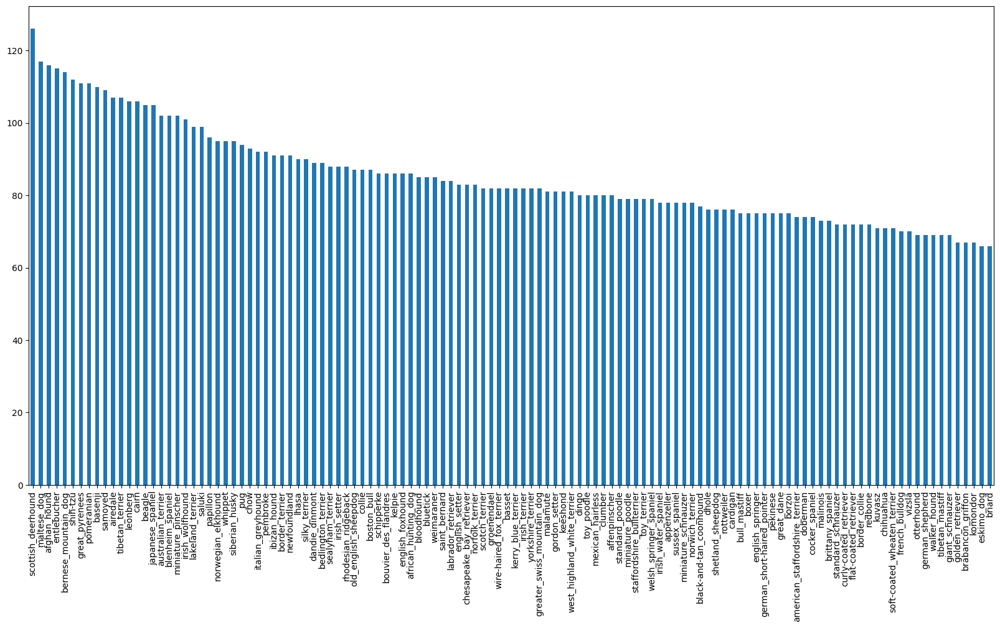

In [4]:
df['breed'].value_counts().plot.bar(figsize=(20,10))

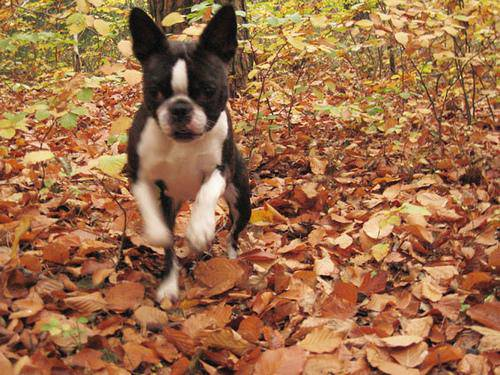

In [5]:
#Lets check an image
from IPython.display import Image
Image('drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

##Getting images and thier Labels

In [6]:
filenames=['drive/MyDrive/DogVision/train/'+ fname +'.jpg' for fname in df['id']]
filenames[:10]

['drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [7]:
#Check Wheather the len of number of files is same as specified by kaggle i.e 10222
if len(filenames)==10222:
  print('proceed')
else:
  print('stop')

proceed


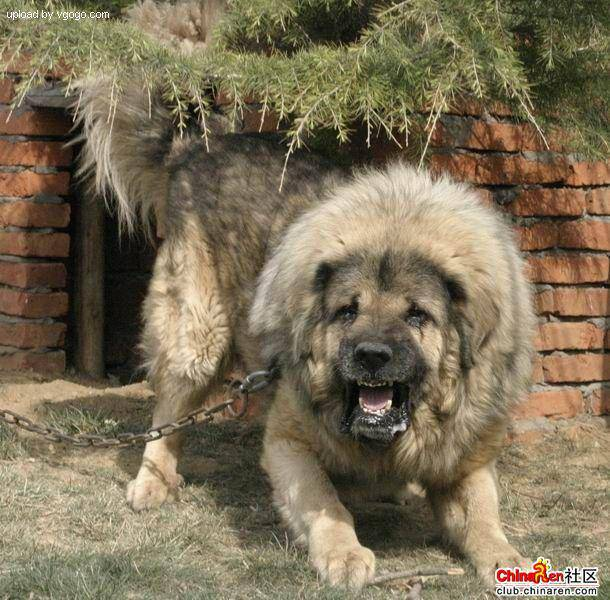

In [8]:
#Viewing some random Images
Image(filenames[9000])

In [9]:
#check wheather breed is same as per image of not
df['breed'][9000]

'tibetan_mastiff'

In [10]:
labels=np.array(df['breed'])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [11]:
#To see if len of filenames matches labels of not
if len(filenames)==len(labels):
  print('proceed')
else:
  print('stop')

proceed


In [12]:
#Find unqiue breeds
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [13]:
len(unique_breeds)

120

In [14]:
#Turn a single label into an array of booleans
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

##Creating our own Validation data set
since kaggle doesn't come with its own validation
set

In [15]:
x=filenames
y=boolean_labels

We are going to start experiment with 1000 images and then increase as needed

In [16]:
NUM_IMAGES=1000

In [17]:
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

#Preprocessing Images(turning images into tensors)
1.Take th image filepatha s input

2.Use tensor flow to read the file and save it to a variable 'image'

3.Turn JPG into tensor

4.Normalize our image
(0-255) to (0,1)

5.Resize the 'image' to be a shape of(224,224)

6.Return the modified image

In [18]:
#Testing of single image 1st
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [19]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [20]:
#Convert numpy array into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [21]:
#Define a funtion for same
IMG_SIZE=224
def process_image(image_path,image_size=IMG_SIZE):
  #Read an image
  image=tf.io.read_file(image_path)
  #Turn the JPG image into numeric tensor with 3 channels RGB
  image=tf.image.decode_jpeg(image,channels=3)
  #Scailing the vales from 0,255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to 224-224
  image=tf.image.resize(image,size=[image_size,image_size])
  return image

In [22]:
#testing function
process_image(filenames[4000])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.20928796, 0.17007226, 0.16615069],
        [0.21515968, 0.17594399, 0.17202242],
        [0.1936899 , 0.15447421, 0.15055265],
        ...,
        [0.3534839 , 0.33387604, 0.31818977],
        [0.37387082, 0.3385767 , 0.31896886],
        [0.37387082, 0.3385767 , 0.31896886]],

       [[0.2545788 , 0.21536312, 0.20751998],
        [0.26913515, 0.2299195 , 0.22207636],
        [0.2321185 , 0.19290282, 0.18505967],
        ...,
        [0.33031332, 0.30976015, 0.29438898],
        [0.3811559 , 0.34459695, 0.32562152],
        [0.38449898, 0.34128082, 0.32562152]],

       [[0.21022934, 0.16832632, 0.16048318],
        [0.22209033, 0.18018731, 0.17234418],
        [0.23538475, 0.19348173, 0.18563859],
        ...,
        [0.31278297, 0.28481564, 0.27191585],
        [0.40682778, 0.35562852, 0.34262955],
        [0.41000405, 0.35486814, 0.34262955]],

       ...,

       [[0.37405425, 0.32699543, 0.27209347],
        [0.38

#Turn our data into Batches
Why turn our data into batches? Lets say you' tring to process 10,000+ images in will fit the memory

So that's why we do about 32 batch size

Inorder to use TensorFlow effectively,we need our data in the from of Tensor tuples '(Image,label)'

In [23]:
# Function for tensor tuples
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label


In [24]:
get_image_label(x[60],tf.constant(y[60]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.34281674, 0.358503  , 0.22124813],
         [0.3810999 , 0.39678618, 0.26546612],
         [0.34983438, 0.36654484, 0.23894364],
         ...,
         [0.26413026, 0.33864006, 0.31511065],
         [0.27914903, 0.35119498, 0.32996956],
         [0.25937283, 0.34660152, 0.2770723 ]],
 
        [[0.2955283 , 0.31121457, 0.16611654],
         [0.33381954, 0.3554407 , 0.21331011],
         [0.31862506, 0.341999  , 0.20406133],
         ...,
         [0.28972998, 0.37208292, 0.34463194],
         [0.24867535, 0.33198234, 0.29976106],
         [0.23500581, 0.32421276, 0.25369442]],
 
        [[0.32032564, 0.3444853 , 0.19515058],
         [0.3706604 , 0.39482006, 0.2514202 ],
         [0.36281163, 0.39316005, 0.25113446],
         ...,
         [0.24368885, 0.3358545 , 0.29270315],
         [0.2055261 , 0.30557874, 0.2591024 ],
         [0.18395968, 0.26928002, 0.19971587]],
 
        ...,
 
        [[0.24485871, 0.24548893

In [25]:
#Define the Batch Size
BATCH_SIZE=32
#Function for Batch
def create_data_batches(x,y,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    #We need to shuffle as it is training set and training set needs to be shiffled
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [26]:
train_data=create_data_batches(x_train,y_train,test_data=False,valid_data=False)
val_data=create_data_batches(x_val,y_val,test_data=False,valid_data=True)

In [27]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

#Visulaizing Our Data Batches


In [28]:
import matplotlib.pyplot as plt
#A function for viewing images
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis('off')

In [29]:
#Batchify our data
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.09184151, 0.11537092, 0.10752779],
          [0.11938831, 0.14291772, 0.13507459],
          [0.15039158, 0.17392099, 0.16607785],
          ...,
          [0.09295317, 0.04981591, 0.0304133 ],
          [0.10817321, 0.06503596, 0.04150655],
          [0.12805596, 0.0849187 , 0.06138929]],
 
         [[0.10954062, 0.13307004, 0.1252269 ],
          [0.12103045, 0.14455986, 0.13671672],
          [0.12918065, 0.15271007, 0.14486693],
          ...,
          [0.11326493, 0.07012767, 0.04659826],
          [0.1228873 , 0.07975005, 0.05975227],
          [0.09442005, 0.05168401, 0.02935831]],
 
         [[0.10573471, 0.128949  , 0.12989438],
          [0.12071782, 0.1439321 , 0.14487748],
          [0.13199991, 0.15521419, 0.15615958],
          ...,
          [0.22315435, 0.16616926, 0.13758312],
          [0.14742713, 0.0880607 , 0.06056955],
          [0.1270306 , 0.07022022, 0.04155374]],
 
         ...,
 
         [[0.05913864, 0.05913864, 0.05913864],
          [0.05913

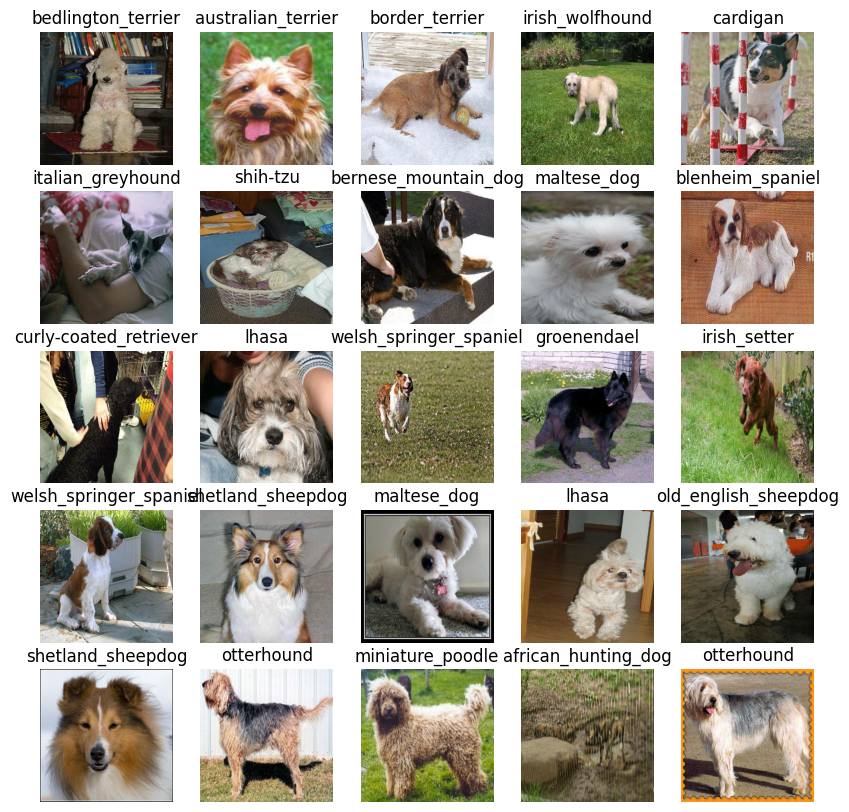

In [30]:
show_25_images(train_images,train_labels)

#Finally Building a model
1. Specify input shape
2.Specify ouput shape
3.Model URL from tensor hub

In [31]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]#Batch size set to None as its flexible,Height,width color channels
OUT_SHAPE=len(unique_breeds)
# we are using mobilnet_v2 tensor HUB
MODEL_URL='https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

#CREATE function which:
1. Takes the input shape,output shape,and model we've choosen as parameter

2.Define Layer in a kera model

3.Compiles the model

4.Builds the model

5.return the model

In [32]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUT_SHAPE,model_url=MODEL_URL):
  model=tf.keras.Sequential([hub.KerasLayer(model_url),tf.keras.layers.Dense(units=OUT_SHAPE,activation='softmax')])
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),optimizer=tf.keras.optimizers.Adam(),metrics=['accuracy'])
  model.build(input_shape)
  return model

In [33]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


##Create Call backs
Callbacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving

we'll create two callbacks,one for Tensor Board which helps track our models(loss function is decresing) progress and another for early stopping which prevents our models from training for too long like for weeks

#Tensor Board Callback

In [34]:
%load_ext tensorboard

In [35]:
import datetime
import os
#Create a function  to build a tensor flow callback
def create_tensorboard_callback():
  #create a log directory for storing tensorflow board
  logdir=os.path.join('drive/MyDrive/DogVision/logs',datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

#Early Stopping Callback
Stop our model from overfitting if a certain evalution metric stops improving.

In [36]:
#Create early stopping
early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=3)
#patience is number of epochs to after which change is not seen

#Training our model on 1000 images
to make sure all is working

In [37]:
NUM_EPOCHS=100
#100 CHANCE to model to run patterns

In [38]:
#funtion to train model
#Create model
#Setup a TensorBoard callback
#call the fit funvtion for number of epochs
#return model
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])
  return model

In [39]:
#Fit the model to the data
model=train_model()

Epoch 1/100
25/25 [==============================] - 127s 5s/step - loss: 4.5579 - accuracy: 0.1037 - val_loss: 3.6325 - val_accuracy: 0.1850
Epoch 2/100
25/25 [==============================] - 73s 3s/step - loss: 1.6463 - accuracy: 0.6875 - val_loss: 2.3667 - val_accuracy: 0.4350
Epoch 3/100
25/25 [==============================] - 73s 3s/step - loss: 0.5673 - accuracy: 0.9388 - val_loss: 1.8443 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 74s 3s/step - loss: 0.2495 - accuracy: 0.9925 - val_loss: 1.6534 - val_accuracy: 0.5800
Epoch 5/100
25/25 [==============================] - 81s 3s/step - loss: 0.1439 - accuracy: 0.9975 - val_loss: 1.5549 - val_accuracy: 0.5900
Epoch 6/100
25/25 [==============================] - 76s 3s/step - loss: 0.0994 - accuracy: 1.0000 - val_loss: 1.4995 - val_accuracy: 0.5800
Epoch 7/100
25/25 [==============================] - 75s 3s/step - loss: 0.0744 - accuracy: 1.0000 - val_loss: 1.4712 - val_accuracy: 0.5850
Epoch 8/100


#Checking tensorboard call back

In [40]:
#Our model is over fitting but its good start

In [41]:
%tensorboard --logdir drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

#Making an evaluative predictions using a training model

In [42]:
predictions=model.predict(val_data,verbose=1)

7/7 [==============================] - 74s 2s/step


In [43]:
predictions.shape
#y_val,unique_breeds

(200, 120)

In [44]:
predictions[0]

array([5.49666933e-04, 1.23494785e-04, 2.31067650e-04, 1.94685941e-04,
       2.55081774e-04, 2.07116736e-05, 1.68299433e-02, 8.33635102e-04,
       4.62547556e-04, 9.69889457e-04, 3.55510310e-05, 2.02969284e-04,
       3.61401297e-04, 3.51863127e-04, 1.14141114e-03, 1.00602058e-03,
       4.05138380e-05, 3.63764077e-01, 5.54925209e-05, 6.67790810e-05,
       1.56490807e-03, 1.62534387e-04, 7.73689608e-05, 1.34879642e-03,
       2.57745196e-05, 6.24407330e-05, 8.21917504e-02, 2.36368087e-05,
       4.47219820e-04, 1.88148813e-03, 4.18015989e-05, 3.10277753e-03,
       5.06781740e-04, 7.91302864e-06, 1.10782385e-04, 5.92323914e-02,
       7.08124344e-06, 3.43697466e-04, 2.80591248e-05, 8.24533709e-05,
       4.71181789e-04, 1.90686624e-05, 3.08117815e-05, 8.15009262e-05,
       3.50766531e-05, 2.96494778e-04, 9.28475420e-05, 7.51526604e-05,
       2.34569481e-04, 2.01237330e-04, 7.95618034e-05, 3.03115463e-04,
       1.47930812e-04, 1.33807480e-04, 1.24640765e-05, 5.16191685e-05,
      

In [45]:
index=42
print(f'Max Value (probability of prediction):{np.max(predictions[index])}')
print(f'MAX INDEX:{np.argmax(predictions[index])}')
print(f'Predicted label:{unique_breeds[np.argmax(predictions[index])]}')

Max Value (probability of prediction):0.561551570892334
MAX INDEX:113
Predicted label:walker_hound


In [46]:
index=100
print(f'Max Value (probability of prediction):{np.max(predictions[index])}')
print(f'MAX INDEX:{np.argmax(predictions[index])}')
print(f'Predicted label:{unique_breeds[np.argmax(predictions[index])]}')

Max Value (probability of prediction):0.6064010262489319
MAX INDEX:14
Predicted label:bloodhound


In [47]:
#Turn predictions into probablities into thier label
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]
pred_label=get_pred_label(predictions[10])
pred_label

'lakeland_terrier'

In [48]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

#Since validation data is in batches we need to unbatch it to make predictions on the validation images and compare that predictions to validation truth label

In [49]:
def unbatchify(data):
  images_=[]
  labels_=[]
  for image,label in data.unbatch().as_numpy_iterator():
     images_.append(image)
     labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_

In [50]:
val_images_,val_labels_=unbatchify(val_data)
val_images_[0],val_labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

#Visualizing Model Predictions
Now we've got ways to get
i) Prediction labels

ii) Validation labels and

iii)Validation images

we'll create an function:

i)Takes an array of prediction proabablities,an array of truth labels and array of images and integes

ii) Convert the prediction probablities to predicted label

iii)plot the predicted label,its predicted probablity

In [51]:
def plot_pred(prediction_probablities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probablities[n],labels[n],images[n]
  #Get the pred_label
  pred_label=get_pred_label(pred_prob)
  #plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #change color if prediction is right
  if pred_label==true_label:
    color='green'
  else:
    color='red'
  plt.title('{} {:2.0f}% {}'.format(pred_label,np.max(pred_prob)*100,true_label),color=color)

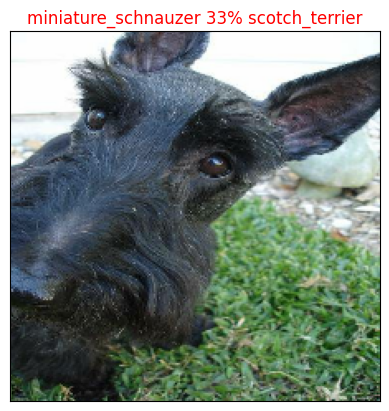

In [52]:
plot_pred(prediction_probablities=predictions,labels=val_labels_,images=val_images_)

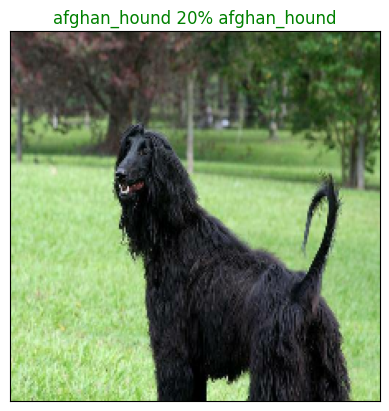

In [53]:
plot_pred(prediction_probablities=predictions,labels=val_labels_,images=val_images_,n=62)

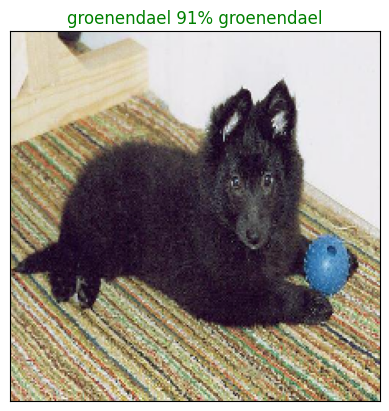

In [54]:
plot_pred(prediction_probablities=predictions,labels=val_labels_,images=val_images_,n=77)

We make more better function for 10 highest prediction probabilities
and plot top 10 predictions

In [55]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  pred_label=get_pred_label(pred_prob)
  top_10_prob_indexes=pred_prob.argsort()[-10:][::-1]
  top_10_pred_values=pred_prob[top_10_prob_indexes]
  top_10_pred_labels=unique_breeds[top_10_prob_indexes]
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation='vertical')
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass

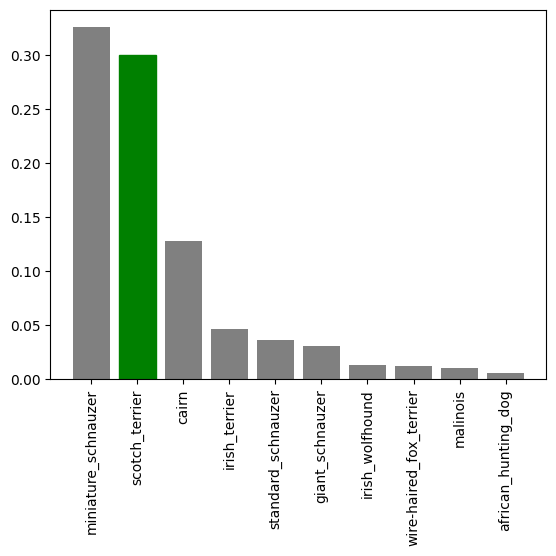

In [56]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels_,n=1)

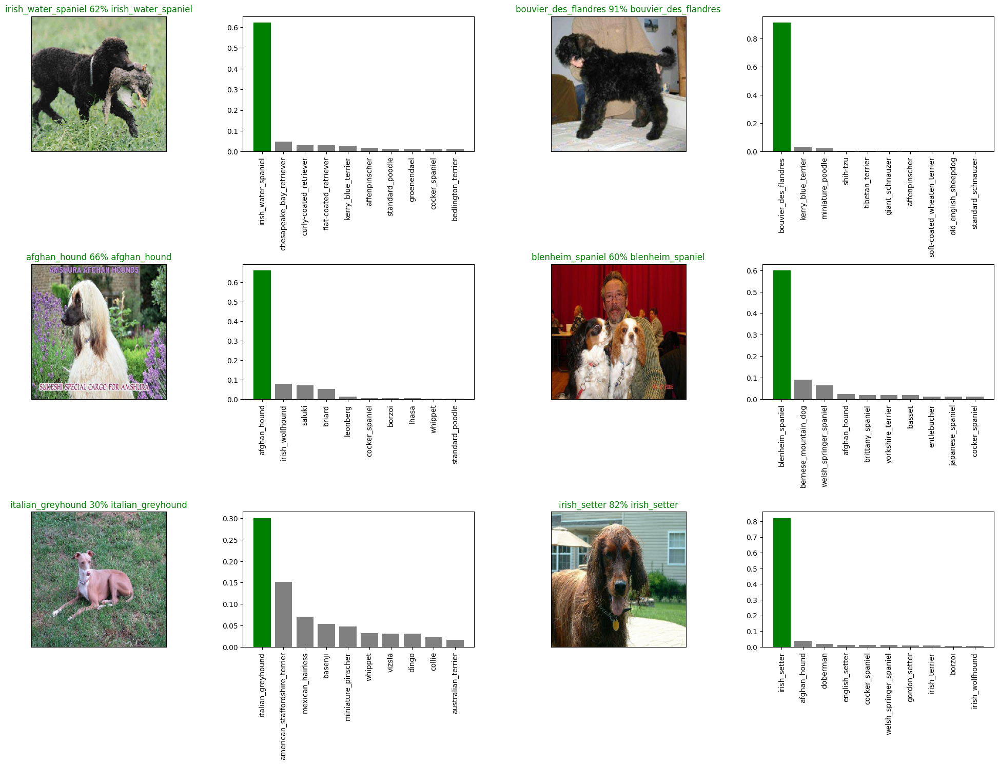

In [57]:
#Lets check few predictions and thier different values
i_multiplier=180
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probablities=predictions,labels=val_labels_,images=val_images_,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels_,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

#Saving and loading a trained model

In [58]:
import os
def save_model(model,suffix=None):
  modeldir=os.path.join('drive/MyDrive/DogVision/models',datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  modelpath=modeldir +'-'+suffix+'.h5'
  print('Saving the model')
  model.save(modelpath)
  return modelpath

In [60]:
def load_model(modelpath):
  print('loading model')
  model=tf.keras.models.load_model(modelpath,custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [61]:
save_model(model,suffix='1000-images-mobilev2-Adam')

Saving the model


'drive/MyDrive/DogVision/models/20230914-17001694710817-1000-images-mobilev2-Adam.h5'

In [62]:
loaded_1000_images_model=load_model('drive/MyDrive/DogVision/models/20230914-17001694710817-1000-images-mobilev2-Adam.h5')

loading model


#Train the model on full training dataset

In [63]:
len(x),len(y)

(10222, 10222)

In [64]:
full_data=create_data_batches(x,y)

In [65]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
full_model=create_model()

In [67]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 972s 3s/step - loss: 1.3641 - accuracy: 0.6633
Epoch 2/100
 78/320 [======>.......................] - ETA: 9:48 - loss: 0.3991 - accuracy: 0.8878